In [1]:
import sys
sys.path.append('splinedistm')

import matplotlib.pyplot as plt
import numpy as np

from csbdeep.utils import normalize
from glob import glob
from skimage import io
from splinedist import fill_label_holes, random_label_cmap, calculate_extents, gputools_available
from splinedist.models import Config2D, SplineDist2D, SplineDistData2D
from splinedist.utils import phi_generator, grid_generator, get_contoursize_max
from stardist import fill_label_holes, random_label_cmap
from stardist.matching import matching_dataset
from stardist.models import Config2D, StarDist2D
from tqdm import tqdm

In [2]:
taus = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

In [3]:
def train_validation_split(X, Y):
  rng = np.random.default_rng(591)
  indices = rng.permutation(len(X))
  split_val = max(1, int(round(0.25 * len(indices))))
  train_indices, valid_indices = indices[split_val:], indices[:split_val]
  X_train, X_valid = [X[i] for i in train_indices], [X[i] for i in valid_indices]
  Y_train, Y_valid = [Y[i] for i in train_indices], [Y[i] for i in valid_indices]

  print(f'Number of images: {len(X)}')
  print(f'- training: {len(train_indices)}')
  print(f'- validation: {len(valid_indices)}')
  return X_train, Y_train, X_valid, Y_valid

In [17]:
def show_test_images(X, Y_truth, Y_pred, file_names, show_num = None):
    num_images = min(show_num, len(X)) if show_num is not None else len(X)
    for i in range(num_images):
        fig, axes = plt.subplots(1, 3, figsize=(20, 10))
        axes[0].imshow(X[i], clim=(0,1), cmap='gray')
        axes[0].set_title(f'{file_names[i]}: raw image')
        axes[0].axis('off')
        axes[1].imshow(Y_truth[i], clim=(0,1), cmap='gray')
        axes[1].set_title(f'{file_names[i]}: ground truth')
        axes[1].axis('off')
        axes[2].imshow(X[i], clim=(0,1), cmap='gray')
        axes[2].imshow(Y_pred[i][0], cmap=lbl_cmap, interpolation="nearest", alpha=0.5)
        num_objects = len(Y_pred[i][1]['coord'])
        axes[2].set_title(f'{file_names[i]}: predicted, {num_objects} objects')
        axes[2].axis('off')

# Load Images and Masks

In [5]:
image_dir = f'images'
hela_dir = f'{image_dir}/fluo-ND2L-HeLa'
merfish_dir = f'{image_dir}/merfish'

model_dir = 'models'

In [6]:
lbl_cmap = random_label_cmap()

In [7]:
# Read test images and masks, normalize test images
hela_X_test_names = sorted(glob(f'{hela_dir}/test/images/*.tif'))
hela_X_test = [normalize(img, 1, 99.8, axis=(0, 1)) for img in list(map(io.imread, hela_X_test_names))]
hela_Y_test_names = sorted(glob(f'{hela_dir}/test/masks/*.tif'))
hela_Y_test = list(map(io.imread, hela_Y_test_names))

# 8 images (20%) chosen for test
merfish_X_test_names = sorted(glob(f'{merfish_dir}/test/images/*.tif'))
merfish_X_test = [normalize(img, 1, 99.8, axis=(0, 1)) for img in list(map(io.imread, merfish_X_test_names))]
merfish_Y_test_names = sorted(glob(f'{merfish_dir}/test/masks/*.tif'))
merfish_Y_test = list(map(io.imread, merfish_Y_test_names))

# Pretrained StarDist Model on HeLa Cells

In [10]:
# Load pretrained model for 2d fluorescent images
pretrained_stardist_model = StarDist2D.from_pretrained('2D_versatile_fluo')

Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


In [11]:
pretrained_stardist_hela_Y_pred = [pretrained_stardist_model.predict_instances(x, n_tiles=pretrained_stardist_model._guess_n_tiles(x), show_tile_progress=False)
              for x in tqdm(hela_X_test)]

100%|██████████| 92/92 [02:55<00:00,  1.91s/it]


In [12]:
pretrained_stardist_hela_Y_pred_labels = [pred[0] for pred in pretrained_stardist_hela_Y_pred]
pretrained_stardist_hela_stats = [matching_dataset(hela_Y_test, pretrained_stardist_hela_Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

100%|██████████| 9/9 [00:41<00:00,  4.65s/it]


In [13]:
pretrained_stardist_hela_stats

[DatasetMatching(criterion='iou', thresh=0.1, fp=3027, tp=24156, fn=665, precision=0.8886436375675973, recall=0.9732081705007857, accuracy=0.8674231542660155, f1=0.9290054611183756, n_true=24821, n_pred=27183, mean_true_score=0.8899826710520118, mean_matched_score=0.9144833531289114, panoptic_quality=0.8495600291586025, by_image=False),
 DatasetMatching(criterion='iou', thresh=0.2, fp=3030, tp=24153, fn=668, precision=0.8885332744730162, recall=0.9730873051045486, accuracy=0.8672220028006176, f1=0.9288900853780478, n_true=24821, n_pred=27183, mean_true_score=0.8899665271240133, mean_matched_score=0.9145803490144137, panoptic_quality=0.8495446184810835, by_image=False),
 DatasetMatching(criterion='iou', thresh=0.3, fp=3061, tp=24122, fn=699, precision=0.8873928558290107, recall=0.9718383626767656, accuracy=0.8651459723118858, f1=0.9276978693946619, n_true=24821, n_pred=27183, mean_true_score=0.88965038213949, mean_matched_score=0.9154304010896395, panoptic_quality=0.8492428326699593, by

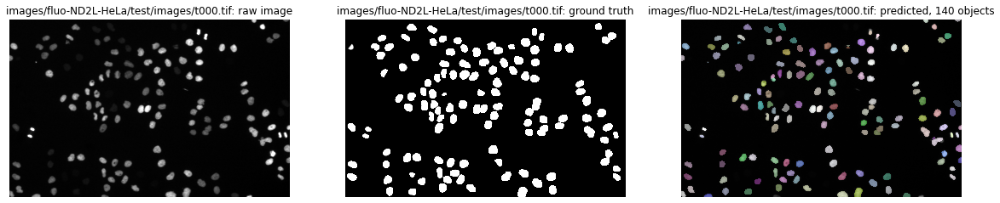

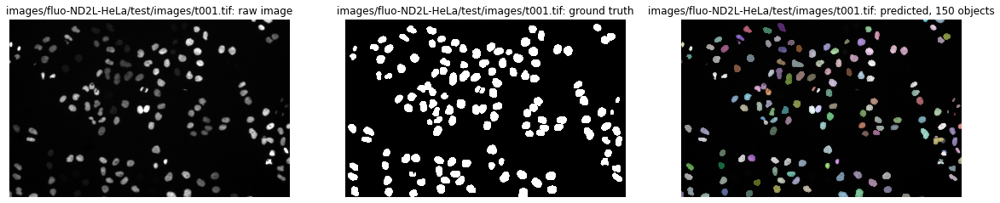

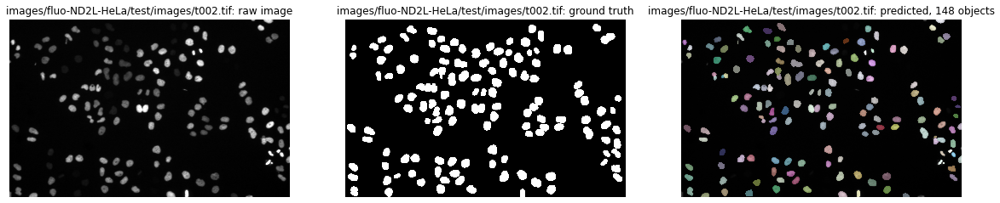

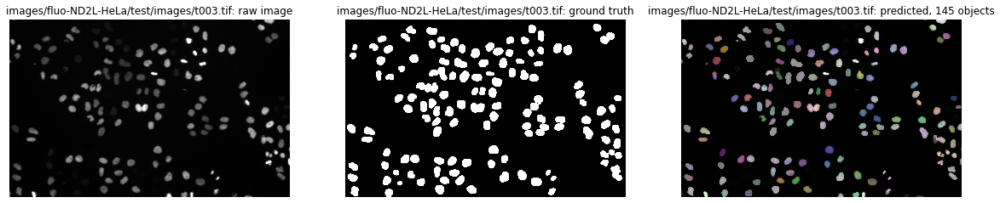

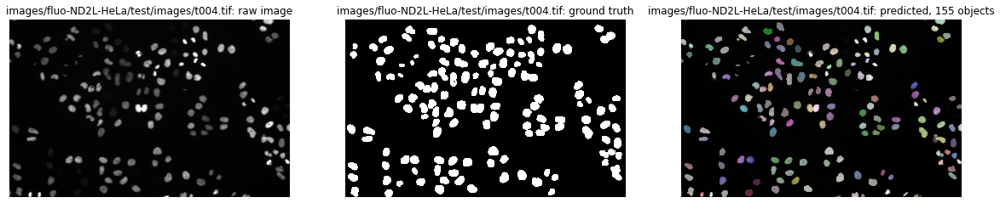

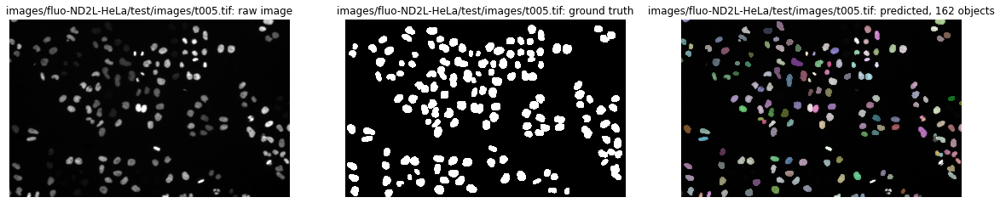

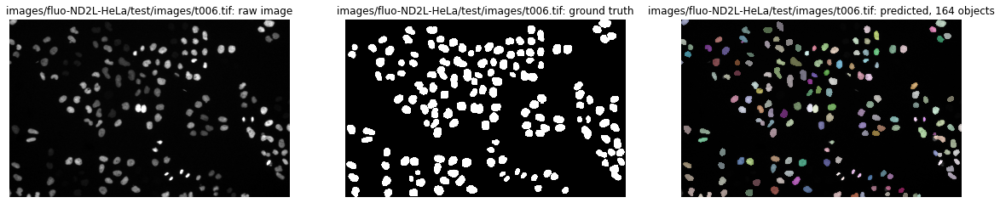

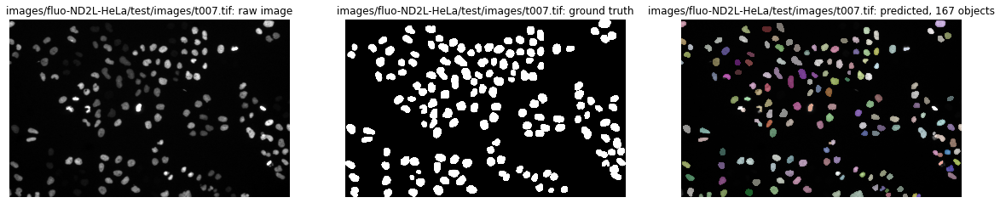

In [14]:
# Show first 8 predictions
show_test_images(hela_X_test, hela_Y_test, pretrained_stardist_hela_Y_pred, hela_X_test_names, 8)

# Pretrained StarDist Model on MERFISH data

In [15]:
pretrained_stardist_merfish_Y_pred = [pretrained_stardist_model.predict_instances(x, n_tiles=pretrained_stardist_model._guess_n_tiles(x), show_tile_progress=False)
              for x in tqdm(merfish_X_test)]

100%|██████████| 8/8 [01:56<00:00, 14.53s/it]


In [21]:
pretrained_stardist_merfish_Y_pred_labels = [pred[0] for pred in pretrained_stardist_merfish_Y_pred]
pretrained_stardist_merfish_stats = [matching_dataset(merfish_Y_test, pretrained_stardist_merfish_Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

100%|██████████| 9/9 [00:18<00:00,  2.04s/it]


In [22]:
pretrained_stardist_merfish_stats

[DatasetMatching(criterion='iou', thresh=0.1, fp=843, tp=40, fn=3, precision=0.045300113250283124, recall=0.9302325581395349, accuracy=0.045146726862302484, f1=0.08639308855291576, n_true=43, n_pred=883, mean_true_score=0.5693592051568376, mean_matched_score=0.6120611455436004, panoptic_quality=0.052877852746747334, by_image=False),
 DatasetMatching(criterion='iou', thresh=0.2, fp=843, tp=40, fn=3, precision=0.045300113250283124, recall=0.9302325581395349, accuracy=0.045146726862302484, f1=0.08639308855291576, n_true=43, n_pred=883, mean_true_score=0.5693592051568376, mean_matched_score=0.6120611455436004, panoptic_quality=0.052877852746747334, by_image=False),
 DatasetMatching(criterion='iou', thresh=0.3, fp=844, tp=39, fn=4, precision=0.044167610419026046, recall=0.9069767441860465, accuracy=0.043968432919954906, f1=0.08423326133909287, n_true=43, n_pred=883, mean_true_score=0.5628197427416587, mean_matched_score=0.620544844561316, panoptic_quality=0.052270516064560096, by_image=Fals

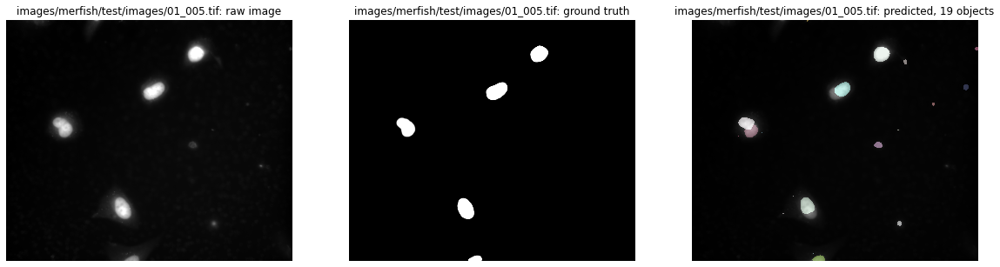

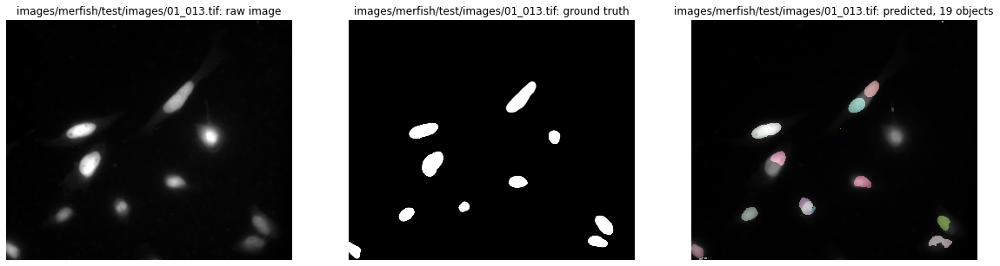

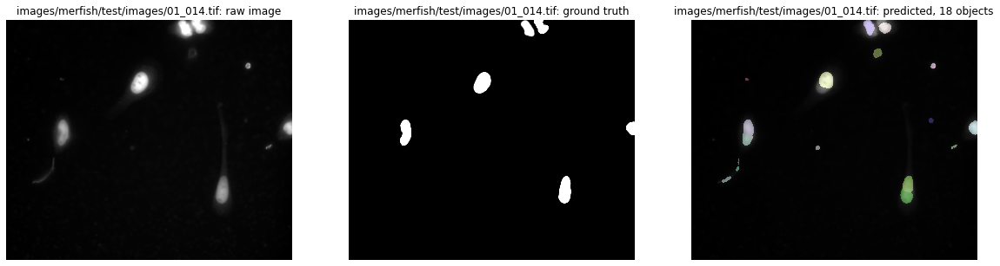

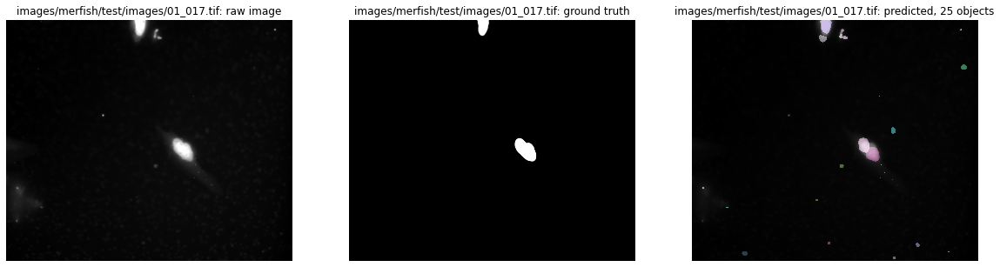

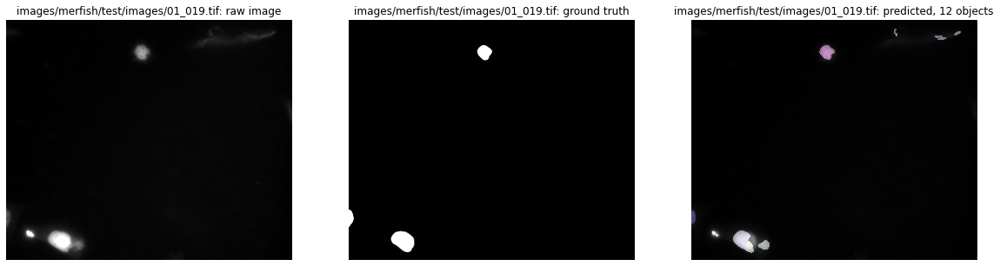

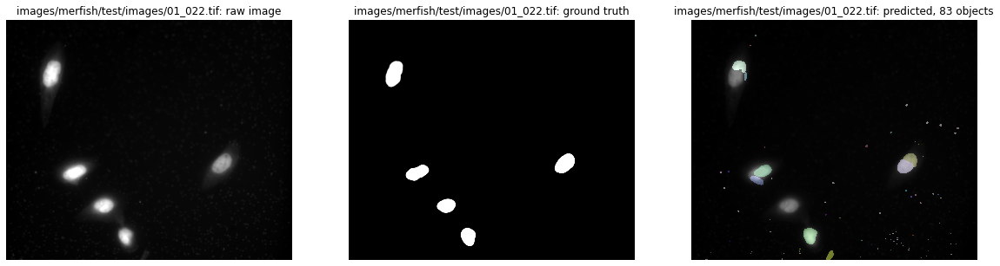

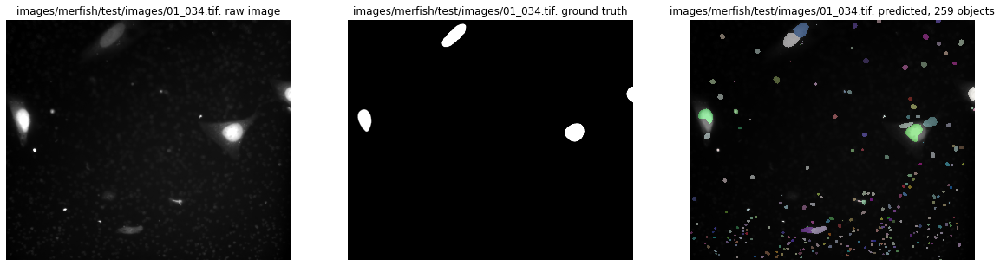

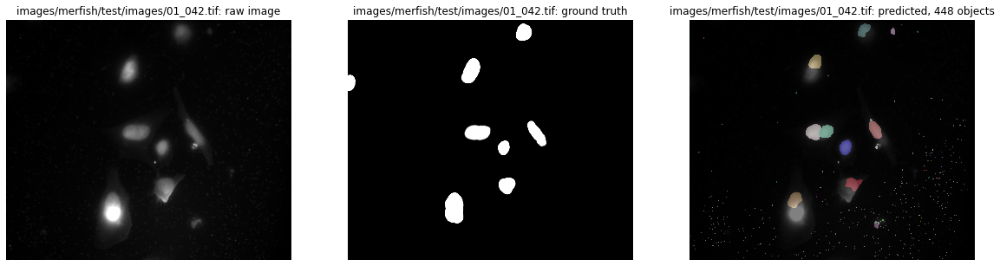

In [16]:
# Show all predictions
show_test_images(merfish_X_test, merfish_Y_test, pretrained_stardist_merfish_Y_pred, merfish_X_test_names)

# Train SplineDist Model on HeLa Cells data

In [88]:
# Read train images and masks, normalize train images
hela_X_train_names = sorted(glob(f'{hela_dir}/train/images/*.tif'))
hela_X_train = [normalize(img, 1, 99.8, axis=(0, 1)) for img in tqdm(list(map(io.imread, hela_X_train_names)))]
hela_Y_train_names = sorted(glob(f'{hela_dir}/train/masks/*.tif'))
hela_Y_train = list(map(io.imread, hela_Y_train_names))

100%|██████████| 92/92 [00:01<00:00, 62.79it/s]


In [90]:
hela_X_train, hela_Y_train, hela_X_valid, hela_Y_valid = train_validation_split(hela_X_train, hela_Y_train)

Number of images: 92
- training: 69
- validation: 23


In [91]:
# Using configuration from SplineDist example
# choose the number of control points (M)
M = 6
n_params = 2 * M

# Predict on subsampled grid for increased efficiency and larger field of view
grid = (2,2)

# compute the size of the largest contour present in the image-set
contoursize_max = get_contoursize_max(hela_Y_train)

conf = Config2D (
    n_params        = n_params,
    grid            = grid,
    n_channel_in    = 1,
    contoursize_max = contoursize_max,
)
print(conf)
vars(conf)

Config2D(axes='YXC', backbone='unet', contoursize_max=132, grid=(2, 2), n_channel_in=1, n_channel_out=13, n_dim=2, n_params=12, net_conv_after_unet=128, net_input_shape=(None, None, 1), net_mask_shape=(None, None, 1), train_background_reg=0.0001, train_batch_size=4, train_checkpoint='weights_best.h5', train_checkpoint_epoch='weights_now.h5', train_checkpoint_last='weights_last.h5', train_completion_crop=32, train_dist_loss='mae', train_epochs=400, train_foreground_only=0.9, train_learning_rate=0.0003, train_loss_weights=(1, 0.2), train_n_val_patches=None, train_patch_size=(256, 256), train_reduce_lr={'factor': 0.5, 'patience': 40, 'min_delta': 0}, train_shape_completion=False, train_steps_per_epoch=100, train_tensorboard=True, unet_activation='relu', unet_batch_norm=False, unet_dropout=0.0, unet_kernel_size=(3, 3), unet_last_activation='relu', unet_n_conv_per_depth=2, unet_n_depth=3, unet_n_filter_base=32, unet_pool=(2, 2), unet_prefix='', use_gpu=False)


{'n_dim': 2,
 'axes': 'YXC',
 'n_channel_in': 1,
 'n_channel_out': 13,
 'train_checkpoint': 'weights_best.h5',
 'train_checkpoint_last': 'weights_last.h5',
 'train_checkpoint_epoch': 'weights_now.h5',
 'n_params': 12,
 'grid': (2, 2),
 'backbone': 'unet',
 'contoursize_max': 132,
 'unet_n_depth': 3,
 'unet_kernel_size': (3, 3),
 'unet_n_filter_base': 32,
 'unet_n_conv_per_depth': 2,
 'unet_pool': (2, 2),
 'unet_activation': 'relu',
 'unet_last_activation': 'relu',
 'unet_batch_norm': False,
 'unet_dropout': 0.0,
 'unet_prefix': '',
 'net_conv_after_unet': 128,
 'net_input_shape': (None, None, 1),
 'net_mask_shape': (None, None, 1),
 'train_shape_completion': False,
 'train_completion_crop': 32,
 'train_patch_size': (256, 256),
 'train_background_reg': 0.0001,
 'train_foreground_only': 0.9,
 'train_dist_loss': 'mae',
 'train_loss_weights': (1, 0.2),
 'train_epochs': 400,
 'train_steps_per_epoch': 100,
 'train_learning_rate': 0.0003,
 'train_batch_size': 4,
 'train_n_val_patches': None,


In [92]:
phi_generator(M, conf.contoursize_max)
grid_generator(M, conf.train_patch_size, conf.grid)

In [93]:
splinedist_hela_model = SplineDist2D(conf, name='splinedist_hela', basedir=model_dir) 

Using default values: prob_thresh=0.5, nms_thresh=0.4.


In [94]:
splinedist_hela_model.train(hela_X_train, hela_Y_train, validation_data=(hela_X_valid, hela_Y_valid), augmenter=None, epochs=300) 

ob_loss: 0.0403 - val_dist_loss: 0.9326 - val_prob_kld: 0.0020 - val_dist_relevant_mae: 0.9241 - val_dist_relevant_mse: 1.8608
Epoch 245/300
100/100 [==============================] - 226s 2s/step - loss: 0.1708 - prob_loss: 0.0396 - dist_loss: 0.6560 - prob_kld: 0.0019 - dist_relevant_mae: 0.6474 - dist_relevant_mse: 0.8015 - val_loss: 0.2279 - val_prob_loss: 0.0403 - val_dist_loss: 0.9383 - val_prob_kld: 0.0020 - val_dist_relevant_mae: 0.9300 - val_dist_relevant_mse: 1.8867
Epoch 246/300
100/100 [==============================] - 229s 2s/step - loss: 0.1693 - prob_loss: 0.0374 - dist_loss: 0.6597 - prob_kld: 0.0018 - dist_relevant_mae: 0.6512 - dist_relevant_mse: 0.7963 - val_loss: 0.2288 - val_prob_loss: 0.0402 - val_dist_loss: 0.9426 - val_prob_kld: 0.0020 - val_dist_relevant_mae: 0.9343 - val_dist_relevant_mse: 1.8977
Epoch 247/300
100/100 [==============================] - 228s 2s/step - loss: 0.1695 - prob_loss: 0.0385 - dist_loss: 0.6550 - prob_kld: 0.0018 - dist_relevant_mae: 

Start: 9:15pm
End: 12:16am

Total time ~ 3 hours

In [27]:
# Load from disk
splinedist_hela_model = SplineDist2D(None, name='splinedist_hela', basedir=model_dir) 

Loading network weights from 'weights_best.h5'.
Couldn't load thresholds from 'thresholds.json', using default values. (Call 'optimize_thresholds' to change that.)
Using default values: prob_thresh=0.5, nms_thresh=0.4.


In [24]:
hela_Y_pred = [splinedist_hela_model.predict_instances(x, n_tiles=splinedist_hela_model._guess_n_tiles(x), show_tile_progress=False)
              for x in tqdm(hela_X_test)]

100%|██████████| 92/92 [09:15<00:00,  6.04s/it]


In [25]:
hela_Y_pred_labels = [pred[0] for pred in hela_Y_pred]
hela_stats = [matching_dataset(hela_Y_test, hela_Y_pred_labels, thresh=t, show_progress=False) for t in taus]

In [26]:
hela_stats

[DatasetMatching(criterion='iou', thresh=0.1, fp=3192, tp=24593, fn=228, precision=0.885117869353968, recall=0.9908142298859837, accuracy=0.8779138257237711, f1=0.9349884043645211, n_true=24821, n_pred=27785, mean_true_score=0.8987596557470637, mean_matched_score=0.9070919942787732, panoptic_quality=0.8481204963425415, by_image=False),
 DatasetMatching(criterion='iou', thresh=0.2, fp=3198, tp=24587, fn=234, precision=0.8849019254993702, recall=0.9905724990935095, accuracy=0.8775116884970913, f1=0.9347602935026423, n_true=24821, n_pred=27785, mean_true_score=0.8987209630985068, mean_matched_score=0.907274292311711, panoptic_quality=0.848083983768697, by_image=False),
 DatasetMatching(criterion='iou', thresh=0.3, fp=3207, tp=24578, fn=243, precision=0.8845780097174735, recall=0.9902099029047984, accuracy=0.8769088054802341, f1=0.934418127209824, n_true=24821, n_pred=27785, mean_true_score=0.8986335792489001, mean_matched_score=0.9075182712400094, panoptic_quality=0.8480015234207866, by_i

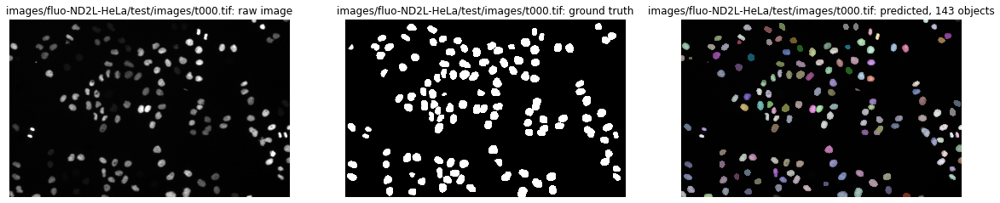

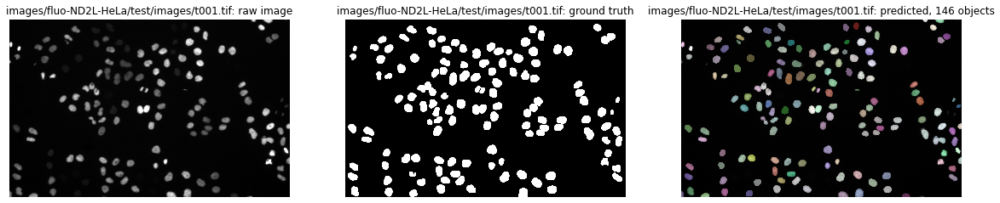

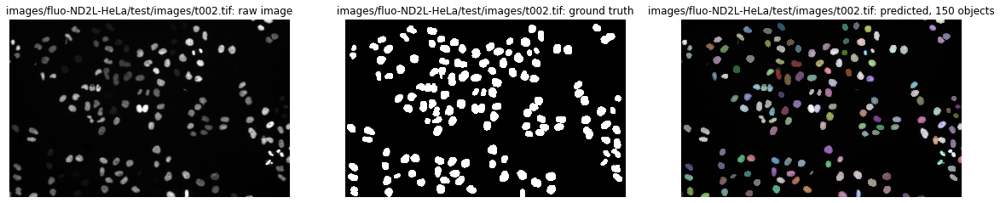

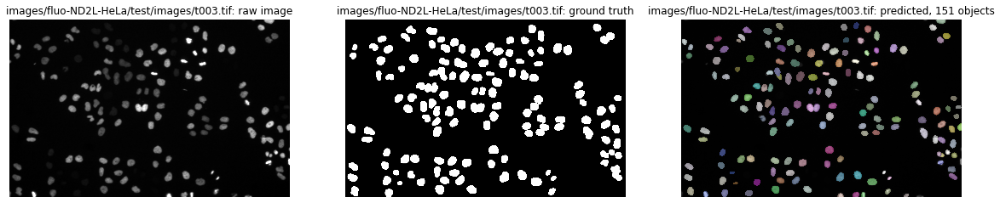

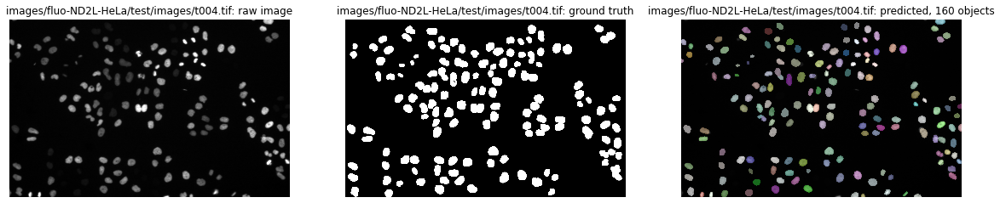

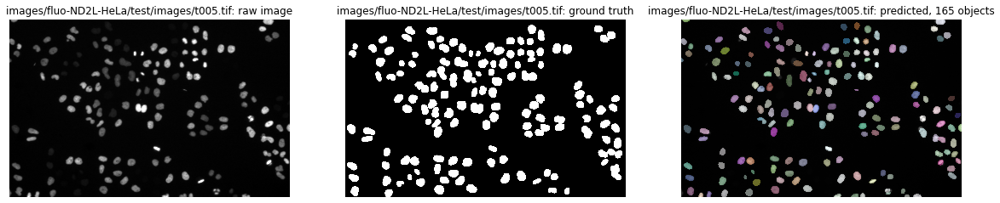

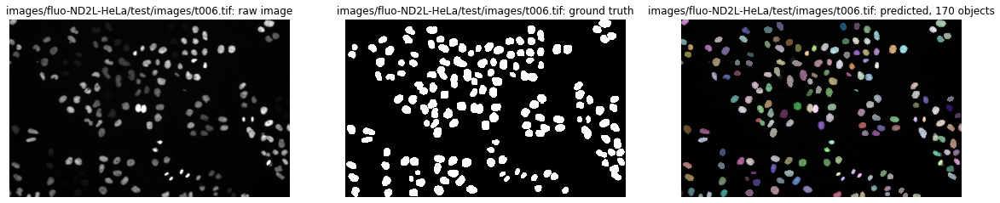

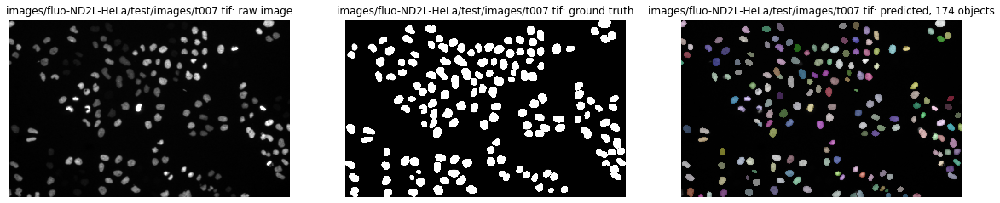

In [27]:
# Show first 8 predictions
show_test_images(hela_X_test, hela_Y_test, hela_Y_pred, hela_X_test_names, 8)


In [28]:
# TODO didnt complete, run this again
merfish_Y_pred = [splinedist_hela_model.predict_instances(x, n_tiles=splinedist_hela_model._guess_n_tiles(x), show_tile_progress=False)
              for x in tqdm(merfish_X_test)]

 25%|██▌       | 2/8 [08:46<26:25, 264.31s/it]

In [ ]:
show_test_images(merfish_X_test, merfish_X_test, merfish_Y_pred, merfish_X_test_names)

# Load auto-segmented ground truth masks and images

In [9]:
# Read train images and normalize
merfish_X_train_names = sorted(glob(f'{merfish_dir}/train/images/*.tif'))
merfish_X_train = [normalize(img, 1, 99.8, axis=(0, 1)) for img in tqdm(list(map(io.imread, merfish_X_train_names)))]
merfish_X_train_dict = {merfish_X_train_names[i][-7:]: merfish_X_train[i] for i in range(len(merfish_X_train_names))}

100%|██████████| 34/34 [00:03<00:00,  9.03it/s]


In [10]:
# Read train masks that have been auto segmentated only and fill small label holes
merfish_Y_auto_train_names = sorted(glob(f'{merfish_dir}/train/masks/auto/*.tif'))
merfish_Y_auto_train = [fill_label_holes(img) for img in tqdm(list(map(io.imread, merfish_Y_auto_train_names)))]

auto_seg_img_names = [img_name[-7:] for img_name in merfish_Y_auto_train_names]
merfish_X_auto_train = []
for img_name in merfish_X_train_dict:
    if img_name in auto_seg_img_names:
        merfish_X_auto_train.append(merfish_X_train_dict[img_name])

100%|██████████| 15/15 [00:01<00:00, 10.34it/s]


In [11]:
# Train validation split
merfish_X_auto_train, merfish_Y_auto_train, merfish_X_auto_valid, merfish_Y_auto_valid = train_validation_split(merfish_X_auto_train, merfish_Y_auto_train)

Number of images: 15
- training: 11
- validation: 4


# Train Stardist Model on MERFISH data using auto-segmented ground truth

In [59]:
conf = Config2D (
    n_rays       = 32,
    grid         = (2,2),
    n_channel_in = 1,
)
print(conf)
vars(conf)

Config2D(axes='YXC', backbone='unet', grid=(2, 2), n_channel_in=1, n_channel_out=33, n_dim=2, n_rays=32, net_conv_after_unet=128, net_input_shape=(None, None, 1), net_mask_shape=(None, None, 1), train_background_reg=0.0001, train_batch_size=4, train_checkpoint='weights_best.h5', train_checkpoint_epoch='weights_now.h5', train_checkpoint_last='weights_last.h5', train_completion_crop=32, train_dist_loss='mae', train_epochs=400, train_foreground_only=0.9, train_learning_rate=0.0003, train_loss_weights=(1, 0.2), train_n_val_patches=None, train_patch_size=(256, 256), train_reduce_lr={'factor': 0.5, 'patience': 40, 'min_delta': 0}, train_shape_completion=False, train_steps_per_epoch=100, train_tensorboard=True, unet_activation='relu', unet_batch_norm=False, unet_dropout=0.0, unet_kernel_size=(3, 3), unet_last_activation='relu', unet_n_conv_per_depth=2, unet_n_depth=3, unet_n_filter_base=32, unet_pool=(2, 2), unet_prefix='', use_gpu=False)


{'n_dim': 2,
 'axes': 'YXC',
 'n_channel_in': 1,
 'n_channel_out': 33,
 'train_checkpoint': 'weights_best.h5',
 'train_checkpoint_last': 'weights_last.h5',
 'train_checkpoint_epoch': 'weights_now.h5',
 'n_rays': 32,
 'grid': (2, 2),
 'backbone': 'unet',
 'unet_n_depth': 3,
 'unet_kernel_size': (3, 3),
 'unet_n_filter_base': 32,
 'unet_n_conv_per_depth': 2,
 'unet_pool': (2, 2),
 'unet_activation': 'relu',
 'unet_last_activation': 'relu',
 'unet_batch_norm': False,
 'unet_dropout': 0.0,
 'unet_prefix': '',
 'net_conv_after_unet': 128,
 'net_input_shape': (None, None, 1),
 'net_mask_shape': (None, None, 1),
 'train_shape_completion': False,
 'train_completion_crop': 32,
 'train_patch_size': (256, 256),
 'train_background_reg': 0.0001,
 'train_foreground_only': 0.9,
 'train_dist_loss': 'mae',
 'train_loss_weights': (1, 0.2),
 'train_epochs': 400,
 'train_steps_per_epoch': 100,
 'train_learning_rate': 0.0003,
 'train_batch_size': 4,
 'train_n_val_patches': None,
 'train_tensorboard': True,

In [60]:
auto_mask_merfish_model = StarDist2D(conf, name='auto_mask_merfish_model', basedir='models')

Using default values: prob_thresh=0.5, nms_thresh=0.4.


In [63]:
auto_mask_merfish_model.train(merfish_X_auto_train, merfish_Y_auto_train, validation_data=(merfish_X_auto_valid, merfish_Y_auto_valid), augmenter=None, epochs=300)

t_mse: 55.9999
Epoch 245/300
100/100 [==============================] - 157s 2s/step - loss: 0.8770 - prob_loss: 0.0714 - dist_loss: 4.0281 - prob_kld: 0.0113 - dist_relevant_mae: 4.0268 - dist_relevant_mse: 50.4081 - val_loss: 1.1534 - val_prob_loss: 0.1102 - val_dist_loss: 5.2163 - val_prob_kld: 0.0134 - val_dist_relevant_mae: 5.2146 - val_dist_relevant_mse: 59.9701
Epoch 246/300
100/100 [==============================] - 157s 2s/step - loss: 0.8008 - prob_loss: 0.0668 - dist_loss: 3.6697 - prob_kld: 0.0069 - dist_relevant_mae: 3.6684 - dist_relevant_mse: 41.9138 - val_loss: 1.0677 - val_prob_loss: 0.1084 - val_dist_loss: 4.7963 - val_prob_kld: 0.0116 - val_dist_relevant_mae: 4.7947 - val_dist_relevant_mse: 51.5767
Epoch 247/300
100/100 [==============================] - 159s 2s/step - loss: 0.8136 - prob_loss: 0.0703 - dist_loss: 3.7161 - prob_kld: 0.0063 - dist_relevant_mae: 3.7147 - dist_relevant_mse: 42.8793 - val_loss: 1.1059 - val_prob_loss: 0.1084 - val_dist_loss: 4.9876 - val

In [12]:
# Load from disk
auto_mask_merfish_model = StarDist2D(None, name='auto_mask_merfish_model', basedir=model_dir) 

Loading network weights from 'weights_best.h5'.
Couldn't load thresholds from 'thresholds.json', using default values. (Call 'optimize_thresholds' to change that.)
Using default values: prob_thresh=0.5, nms_thresh=0.4.


In [13]:
merfish_Y_pred = [auto_mask_merfish_model.predict_instances(x, n_tiles=auto_mask_merfish_model._guess_n_tiles(x), show_tile_progress=False)
              for x in tqdm(merfish_X_test)]

100%|██████████| 8/8 [03:03<00:00, 22.98s/it]


In [14]:
merfish_Y_pred_labels = [pred[0] for pred in merfish_Y_pred]
merfish_stats = [matching_dataset(merfish_Y_test, merfish_Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

100%|██████████| 9/9 [00:20<00:00,  2.33s/it]


In [15]:
merfish_stats

[DatasetMatching(criterion='iou', thresh=0.1, fp=2, tp=37, fn=6, precision=0.9487179487179487, recall=0.8604651162790697, accuracy=0.8222222222222222, f1=0.9024390243902439, n_true=43, n_pred=39, mean_true_score=0.6675670120716164, mean_matched_score=0.7758211221372839, panoptic_quality=0.7001312565629147, by_image=False),
 DatasetMatching(criterion='iou', thresh=0.2, fp=2, tp=37, fn=6, precision=0.9487179487179487, recall=0.8604651162790697, accuracy=0.8222222222222222, f1=0.9024390243902439, n_true=43, n_pred=39, mean_true_score=0.6675670120716164, mean_matched_score=0.7758211221372839, panoptic_quality=0.7001312565629147, by_image=False),
 DatasetMatching(criterion='iou', thresh=0.3, fp=2, tp=37, fn=6, precision=0.9487179487179487, recall=0.8604651162790697, accuracy=0.8222222222222222, f1=0.9024390243902439, n_true=43, n_pred=39, mean_true_score=0.6675670120716164, mean_matched_score=0.7758211221372839, panoptic_quality=0.7001312565629147, by_image=False),
 DatasetMatching(criterio

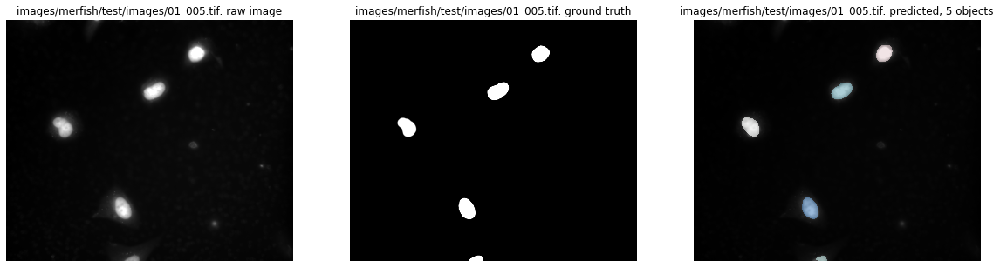

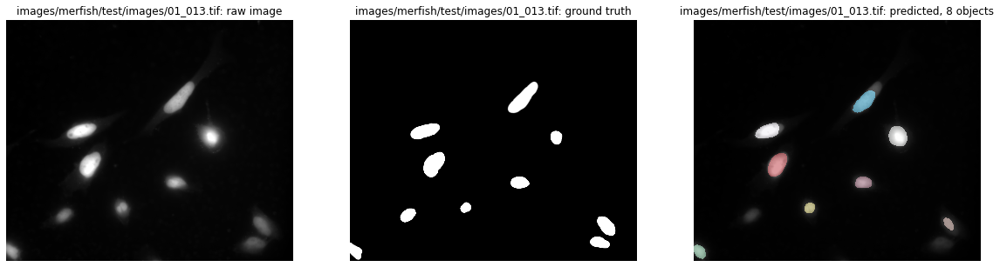

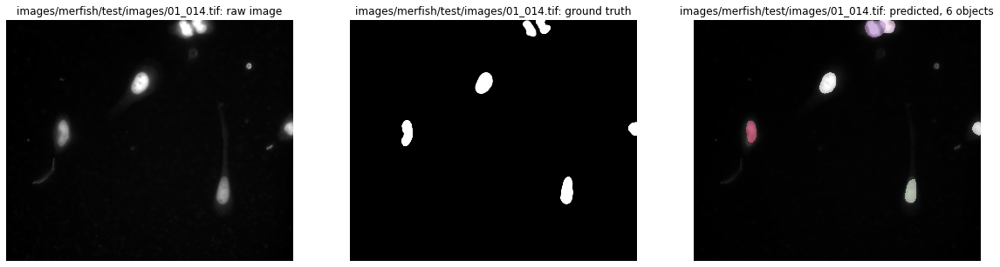

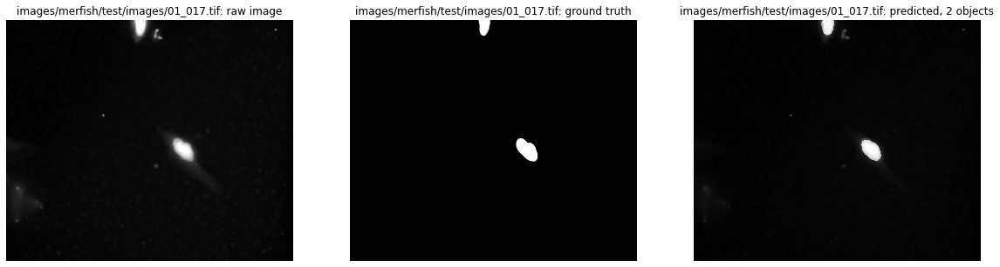

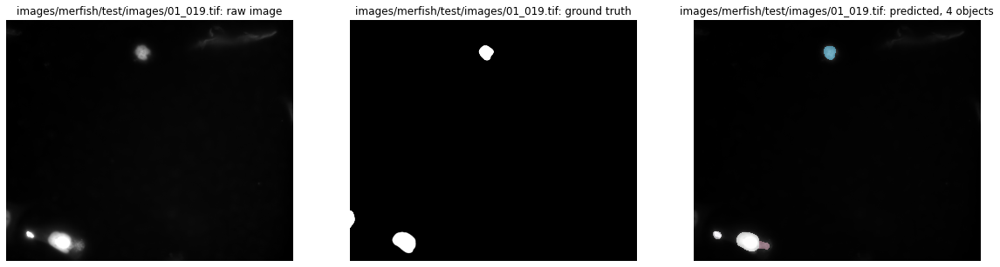

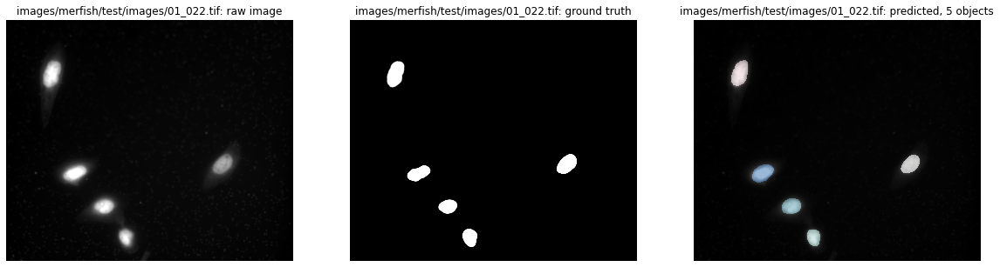

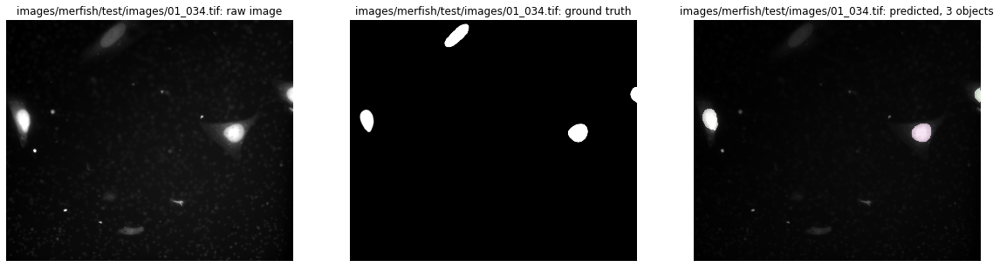

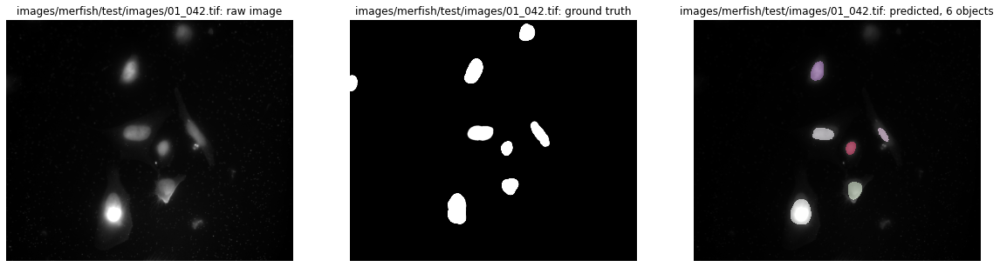

In [18]:
show_test_images(merfish_X_test, merfish_Y_test, merfish_Y_pred, merfish_X_test_names)

# Train Splinedist Model on MERFISH data using auto-segmented ground truth

In [72]:
# Using configuration from SplineDist example
# choose the number of control points (M)
M = 6
n_params = 2 * M

# Predict on subsampled grid for increased efficiency and larger field of view
grid = (2,2)

# compute the size of the largest contour present in the image-set
contoursize_max = get_contoursize_max(merfish_Y_auto_train)

conf = Config2D (
    n_params        = n_params,
    grid            = grid,
    n_channel_in    = 1,
    contoursize_max = contoursize_max,
)
print(conf)
vars(conf)

Config2D(axes='YXC', backbone='unet', contoursize_max=716, grid=(2, 2), n_channel_in=1, n_channel_out=13, n_dim=2, n_params=12, net_conv_after_unet=128, net_input_shape=(None, None, 1), net_mask_shape=(None, None, 1), train_background_reg=0.0001, train_batch_size=4, train_checkpoint='weights_best.h5', train_checkpoint_epoch='weights_now.h5', train_checkpoint_last='weights_last.h5', train_completion_crop=32, train_dist_loss='mae', train_epochs=400, train_foreground_only=0.9, train_learning_rate=0.0003, train_loss_weights=(1, 0.2), train_n_val_patches=None, train_patch_size=(256, 256), train_reduce_lr={'factor': 0.5, 'patience': 40, 'min_delta': 0}, train_shape_completion=False, train_steps_per_epoch=100, train_tensorboard=True, unet_activation='relu', unet_batch_norm=False, unet_dropout=0.0, unet_kernel_size=(3, 3), unet_last_activation='relu', unet_n_conv_per_depth=2, unet_n_depth=3, unet_n_filter_base=32, unet_pool=(2, 2), unet_prefix='', use_gpu=False)


{'n_dim': 2,
 'axes': 'YXC',
 'n_channel_in': 1,
 'n_channel_out': 13,
 'train_checkpoint': 'weights_best.h5',
 'train_checkpoint_last': 'weights_last.h5',
 'train_checkpoint_epoch': 'weights_now.h5',
 'n_params': 12,
 'grid': (2, 2),
 'backbone': 'unet',
 'contoursize_max': 716,
 'unet_n_depth': 3,
 'unet_kernel_size': (3, 3),
 'unet_n_filter_base': 32,
 'unet_n_conv_per_depth': 2,
 'unet_pool': (2, 2),
 'unet_activation': 'relu',
 'unet_last_activation': 'relu',
 'unet_batch_norm': False,
 'unet_dropout': 0.0,
 'unet_prefix': '',
 'net_conv_after_unet': 128,
 'net_input_shape': (None, None, 1),
 'net_mask_shape': (None, None, 1),
 'train_shape_completion': False,
 'train_completion_crop': 32,
 'train_patch_size': (256, 256),
 'train_background_reg': 0.0001,
 'train_foreground_only': 0.9,
 'train_dist_loss': 'mae',
 'train_loss_weights': (1, 0.2),
 'train_epochs': 400,
 'train_steps_per_epoch': 100,
 'train_learning_rate': 0.0003,
 'train_batch_size': 4,
 'train_n_val_patches': None,


In [73]:
phi_generator(M, conf.contoursize_max)
grid_generator(M, conf.train_patch_size, conf.grid)

In [74]:
auto_mask_merfish_splinedist_model = SplineDist2D(conf, name='auto_mask_merfish_splinedist_model', basedir=model_dir) 

Using default values: prob_thresh=0.5, nms_thresh=0.4.


In [ ]:
auto_mask_merfish_splinedist_model.train(merfish_X_auto_train, merfish_Y_auto_train, validation_data=(merfish_X_auto_valid, merfish_Y_auto_valid), augmenter=None, epochs=300) # Didn't finish training, 283/300 epochs

In [16]:
# Load from disk
auto_mask_merfish_splinedist_model = SplineDist2D(None, name='auto_mask_merfish_splinedist_model', basedir=model_dir) 

Loading network weights from 'weights_best.h5'.
Couldn't load thresholds from 'thresholds.json', using default values. (Call 'optimize_thresholds' to change that.)
Using default values: prob_thresh=0.5, nms_thresh=0.4.


In [17]:
# TODO run again
merfish_Y_pred = [auto_mask_merfish_splinedist_model.predict_instances(x, n_tiles=auto_mask_merfish_splinedist_model._guess_n_tiles(x), show_tile_progress=False)
              for x in tqdm(merfish_X_test)]

  0%|          | 0/8 [00:00<?, ?it/s]

In [ ]:
show_test_images(merfish_X_test, merfish_Y_test, merfish_Y_pred, merfish_X_test_names)

# Load manually-segmented ground truth masks and images

In [19]:
# Read train masks that have been manually segmentated only and fill small label holes
merfish_Y_manual_train_names = sorted(glob(f'{merfish_dir}/train/masks/manual/*.tif'))
merfish_Y_manual_train = [fill_label_holes(img) for img in tqdm(list(map(io.imread, merfish_Y_manual_train_names)))]

manual_seg_img_names = [img_name[-7:] for img_name in merfish_Y_manual_train_names]
merfish_X_manual_train = []
for img_name in merfish_X_train_dict:
    if img_name in manual_seg_img_names:
        merfish_X_manual_train.append(merfish_X_train_dict[img_name])

100%|██████████| 34/34 [00:01<00:00, 27.32it/s]


In [20]:
# Train validation split
merfish_X_manual_train, merfish_Y_manual_train, merfish_X_manual_valid, merfish_Y_manual_valid = train_validation_split(merfish_X_manual_train, merfish_Y_manual_train)

Number of images: 34
- training: 26
- validation: 8


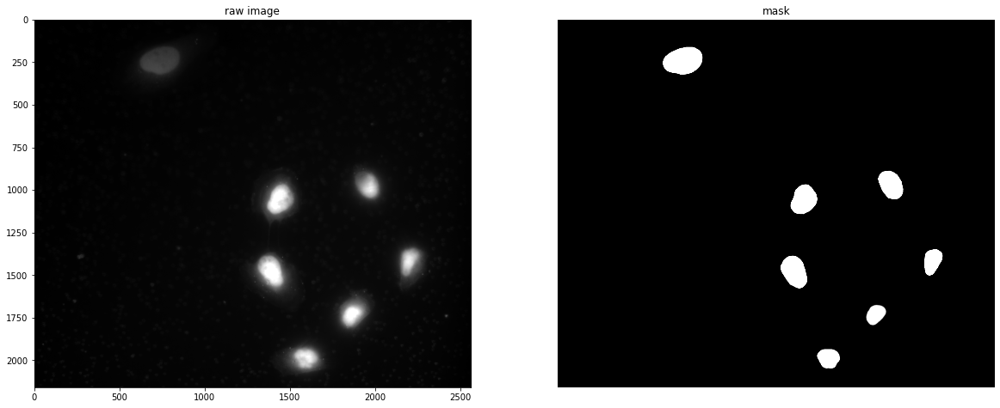

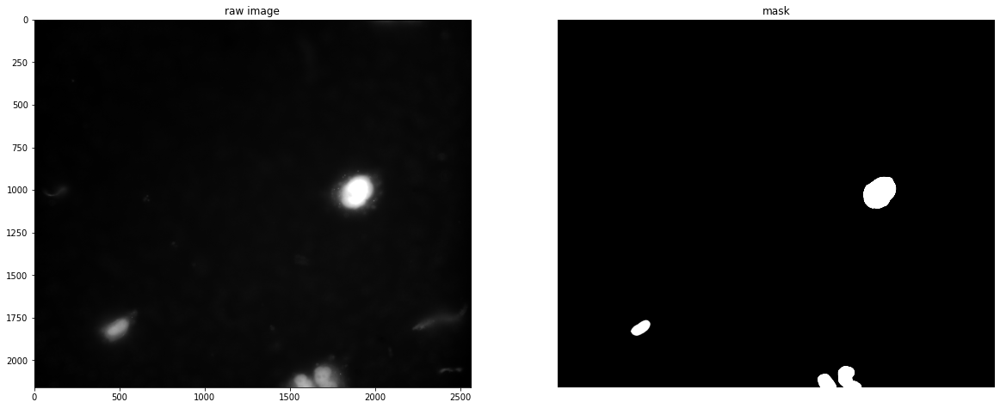

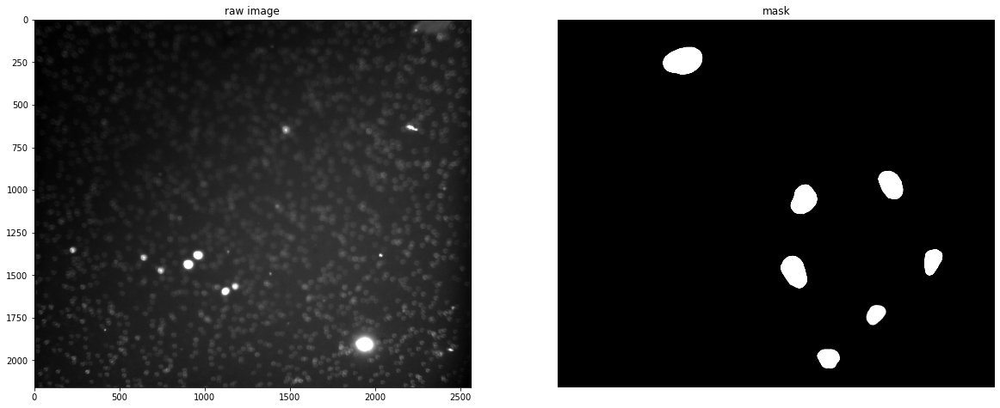

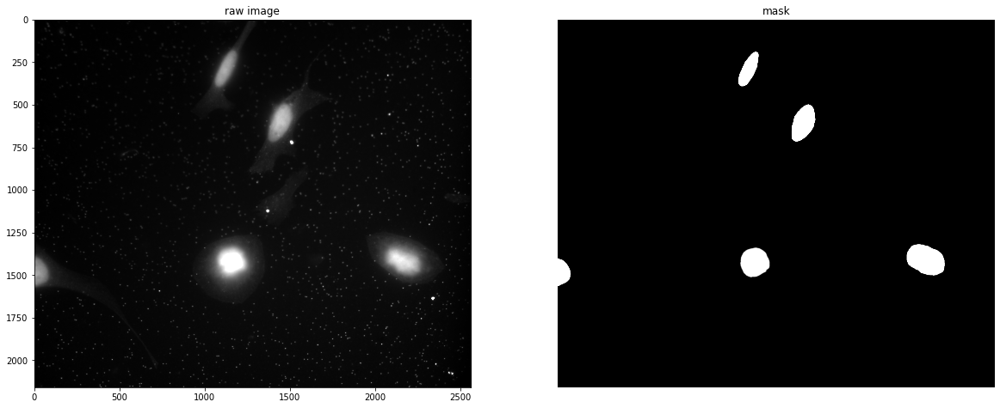

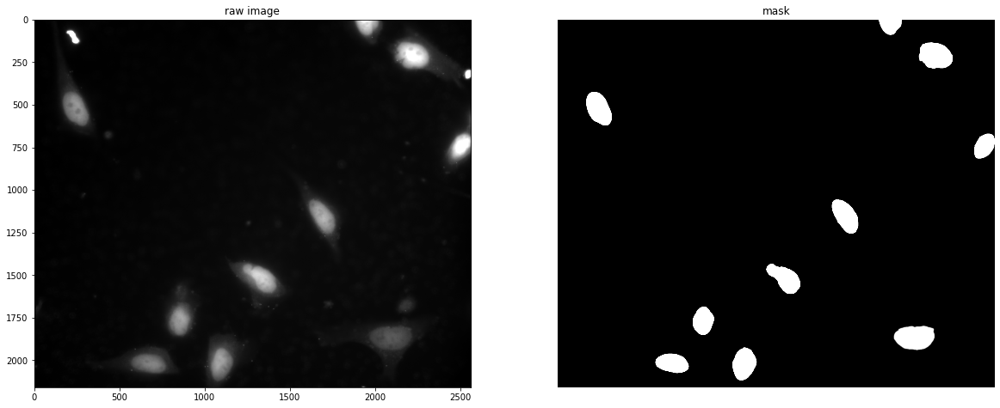

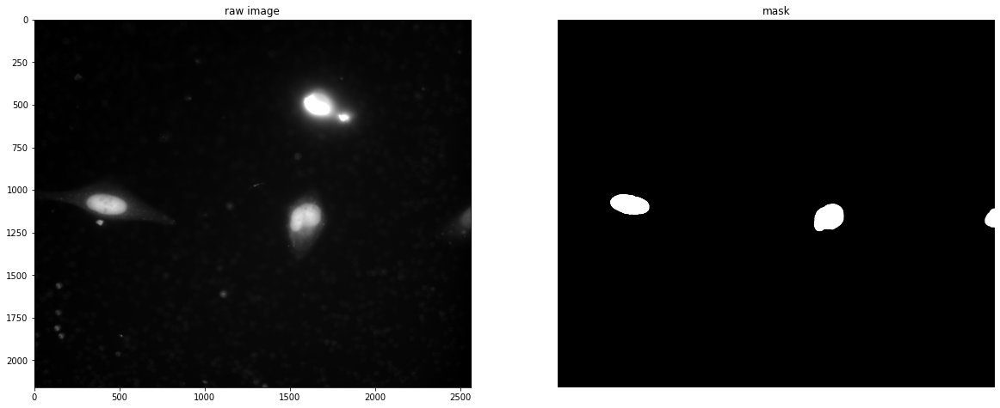

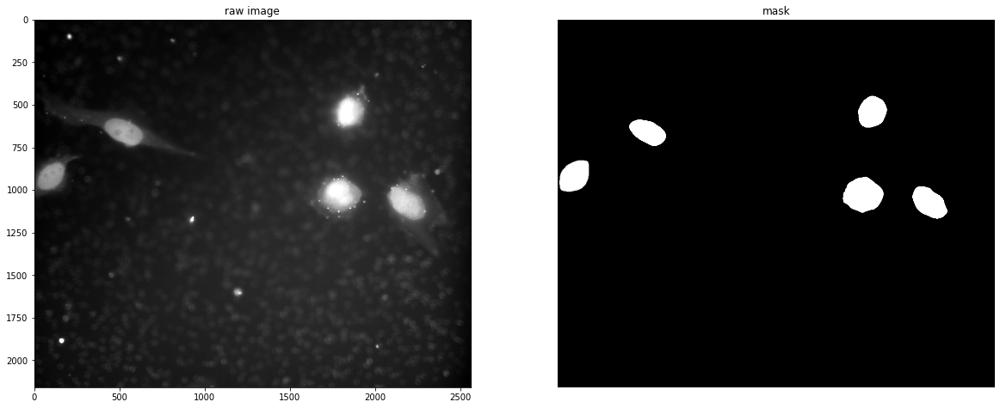

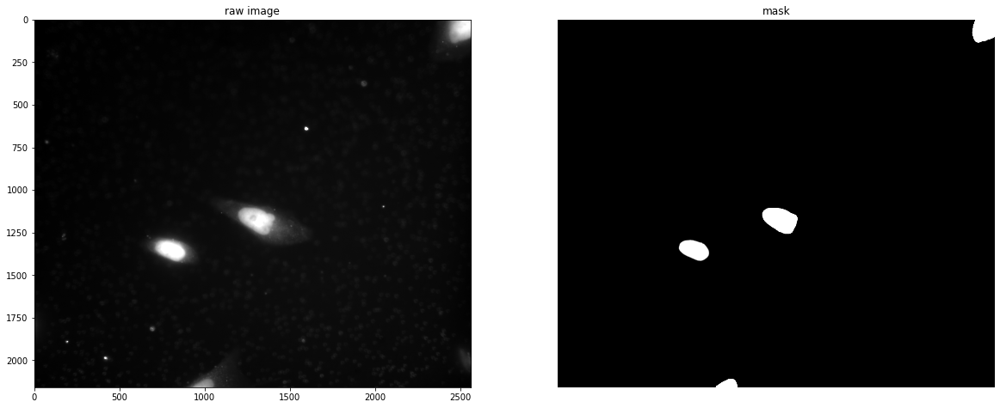

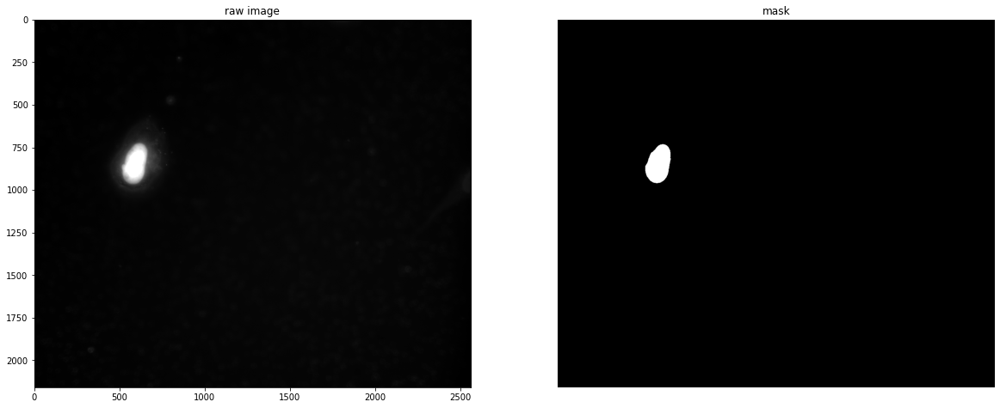

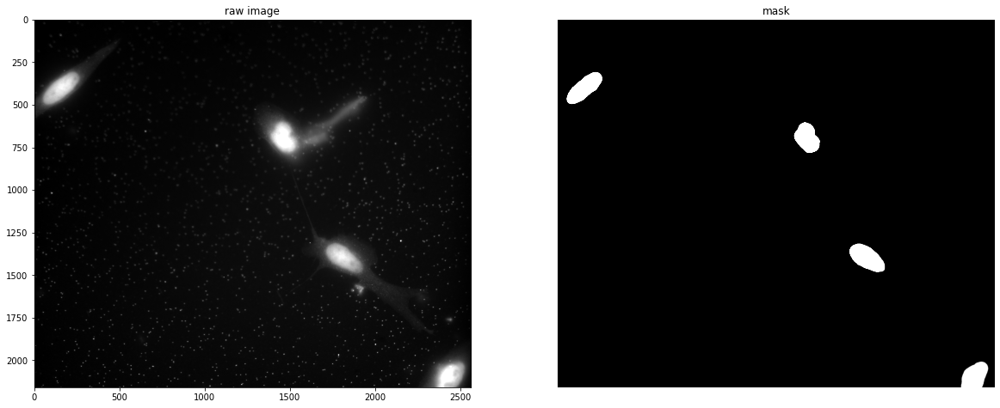

In [21]:
# Show some manually segmented images and masks
for i in range(10):
  fig, axes = plt.subplots(1, 2, figsize=(20, 10))
  axes[0].imshow(merfish_X_manual_train[i], clim=(0,1), cmap='gray')
  axes[0].set_title('raw image')
  axes[1].imshow(merfish_Y_manual_train[i], clim=(0,1), cmap='gray')
  axes[1].set_title('mask')
  axes[1].axis('off')

# Train Stardist Model on MERFISH data using manually-segmented ground truth

In [21]:
conf = Config2D (
    n_rays       = 32,
    grid         = (2,2),
    n_channel_in = 1,
)
print(conf)
vars(conf)

Config2D(axes='YXC', backbone='unet', grid=(2, 2), n_channel_in=1, n_channel_out=33, n_dim=2, n_rays=32, net_conv_after_unet=128, net_input_shape=(None, None, 1), net_mask_shape=(None, None, 1), train_background_reg=0.0001, train_batch_size=4, train_checkpoint='weights_best.h5', train_checkpoint_epoch='weights_now.h5', train_checkpoint_last='weights_last.h5', train_completion_crop=32, train_dist_loss='mae', train_epochs=400, train_foreground_only=0.9, train_learning_rate=0.0003, train_loss_weights=(1, 0.2), train_n_val_patches=None, train_patch_size=(256, 256), train_reduce_lr={'factor': 0.5, 'patience': 40, 'min_delta': 0}, train_shape_completion=False, train_steps_per_epoch=100, train_tensorboard=True, unet_activation='relu', unet_batch_norm=False, unet_dropout=0.0, unet_kernel_size=(3, 3), unet_last_activation='relu', unet_n_conv_per_depth=2, unet_n_depth=3, unet_n_filter_base=32, unet_pool=(2, 2), unet_prefix='', use_gpu=False)


{'n_dim': 2,
 'axes': 'YXC',
 'n_channel_in': 1,
 'n_channel_out': 33,
 'train_checkpoint': 'weights_best.h5',
 'train_checkpoint_last': 'weights_last.h5',
 'train_checkpoint_epoch': 'weights_now.h5',
 'n_rays': 32,
 'grid': (2, 2),
 'backbone': 'unet',
 'unet_n_depth': 3,
 'unet_kernel_size': (3, 3),
 'unet_n_filter_base': 32,
 'unet_n_conv_per_depth': 2,
 'unet_pool': (2, 2),
 'unet_activation': 'relu',
 'unet_last_activation': 'relu',
 'unet_batch_norm': False,
 'unet_dropout': 0.0,
 'unet_prefix': '',
 'net_conv_after_unet': 128,
 'net_input_shape': (None, None, 1),
 'net_mask_shape': (None, None, 1),
 'train_shape_completion': False,
 'train_completion_crop': 32,
 'train_patch_size': (256, 256),
 'train_background_reg': 0.0001,
 'train_foreground_only': 0.9,
 'train_dist_loss': 'mae',
 'train_loss_weights': (1, 0.2),
 'train_epochs': 400,
 'train_steps_per_epoch': 100,
 'train_learning_rate': 0.0003,
 'train_batch_size': 4,
 'train_n_val_patches': None,
 'train_tensorboard': True,

In [22]:
manual_mask_merfish_model = StarDist2D(conf, name='manual_mask_merfish_model', basedir=model_dir)

Using default values: prob_thresh=0.5, nms_thresh=0.4.


In [23]:
manual_mask_merfish_model.train(merfish_X_manual_train, merfish_Y_manual_train, validation_data=(merfish_X_manual_valid, merfish_Y_manual_valid), augmenter=None, epochs=300)

mse: 36.7855
Epoch 245/300
100/100 [==============================] - 269s 3s/step - loss: 1.0279 - prob_loss: 0.0682 - dist_loss: 4.7984 - prob_kld: 0.0141 - dist_relevant_mae: 4.7947 - dist_relevant_mse: 66.2841 - val_loss: 0.8005 - val_prob_loss: 0.0554 - val_dist_loss: 3.7254 - val_prob_kld: 0.0050 - val_dist_relevant_mae: 3.7215 - val_dist_relevant_mse: 32.8497
Epoch 246/300
100/100 [==============================] - 177s 2s/step - loss: 1.1955 - prob_loss: 0.0783 - dist_loss: 5.5863 - prob_kld: 0.0187 - dist_relevant_mae: 5.5824 - dist_relevant_mse: 88.3335 - val_loss: 0.8512 - val_prob_loss: 0.0559 - val_dist_loss: 3.9766 - val_prob_kld: 0.0054 - val_dist_relevant_mae: 3.9732 - val_dist_relevant_mse: 37.2603
Epoch 247/300
100/100 [==============================] - 159s 2s/step - loss: 1.0213 - prob_loss: 0.0719 - dist_loss: 4.7468 - prob_kld: 0.0135 - dist_relevant_mae: 4.7430 - dist_relevant_mse: 63.9624 - val_loss: 0.8801 - val_prob_loss: 0.0558 - val_dist_loss: 4.1215 - val_p

In [22]:
# Load from disk
manual_mask_merfish_model = StarDist2D(None, name='manual_mask_merfish_model', basedir=model_dir) 

Loading network weights from 'weights_best.h5'.
Couldn't load thresholds from 'thresholds.json', using default values. (Call 'optimize_thresholds' to change that.)
Using default values: prob_thresh=0.5, nms_thresh=0.4.


In [23]:
merfish_Y_pred = [manual_mask_merfish_model.predict_instances(x, n_tiles=manual_mask_merfish_model._guess_n_tiles(x), show_tile_progress=False)
              for x in tqdm(merfish_X_test)]

100%|██████████| 8/8 [02:39<00:00, 19.96s/it]


In [24]:
merfish_Y_pred_labels = [pred[0] for pred in merfish_Y_pred]
merfish_stats = [matching_dataset(merfish_Y_test, merfish_Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

100%|██████████| 9/9 [00:21<00:00,  2.35s/it]


In [25]:
merfish_stats

[DatasetMatching(criterion='iou', thresh=0.1, fp=0, tp=42, fn=1, precision=1.0, recall=0.9767441860465116, accuracy=0.9767441860465116, f1=0.9882352941176471, n_true=43, n_pred=42, mean_true_score=0.795870611913464, mean_matched_score=0.8148199121971179, panoptic_quality=0.8052337955830341, by_image=False),
 DatasetMatching(criterion='iou', thresh=0.2, fp=0, tp=42, fn=1, precision=1.0, recall=0.9767441860465116, accuracy=0.9767441860465116, f1=0.9882352941176471, n_true=43, n_pred=42, mean_true_score=0.795870611913464, mean_matched_score=0.8148199121971179, panoptic_quality=0.8052337955830341, by_image=False),
 DatasetMatching(criterion='iou', thresh=0.3, fp=0, tp=42, fn=1, precision=1.0, recall=0.9767441860465116, accuracy=0.9767441860465116, f1=0.9882352941176471, n_true=43, n_pred=42, mean_true_score=0.795870611913464, mean_matched_score=0.8148199121971179, panoptic_quality=0.8052337955830341, by_image=False),
 DatasetMatching(criterion='iou', thresh=0.4, fp=0, tp=42, fn=1, precisio

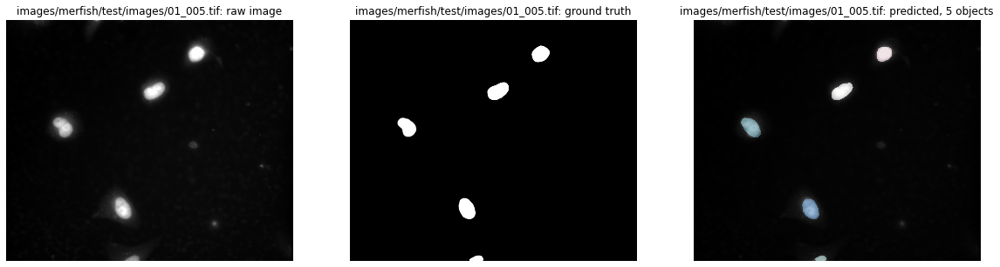

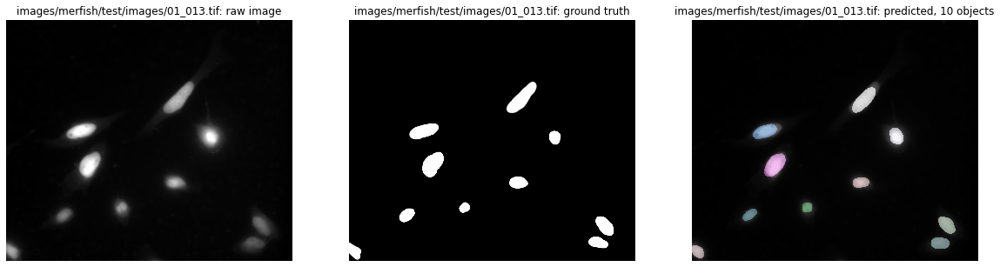

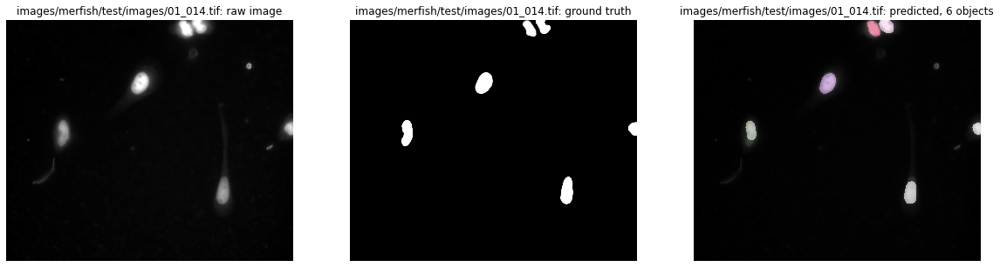

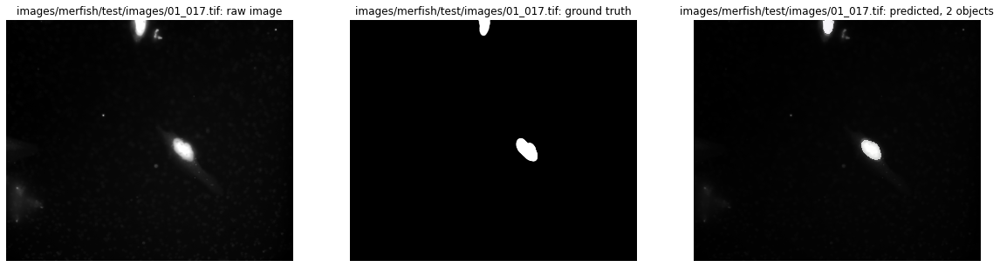

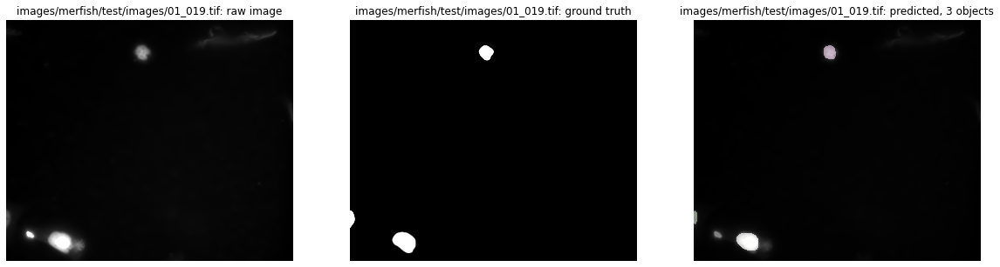

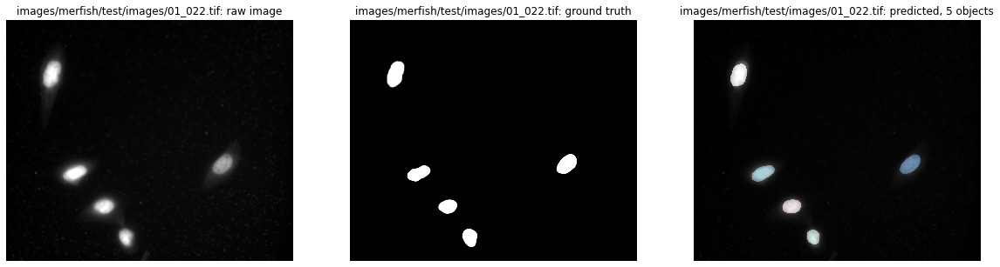

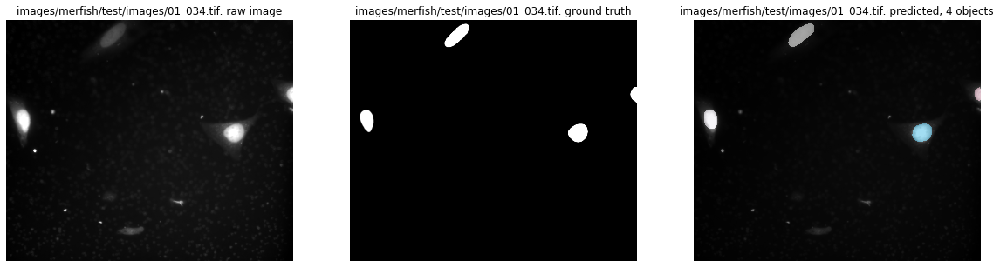

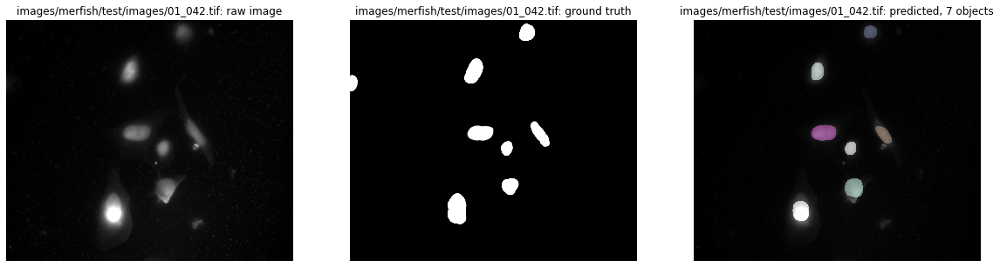

In [26]:
show_test_images(merfish_X_test, merfish_Y_test, merfish_Y_pred, merfish_X_test_names)